In [32]:
import os
import numpy as np
import matplotlib.pyplot as plt
import torch
from customLib.dataset import label_ecgs, split_dataset
from customLib.preprocess import myConv1D, split_signal, resample_signal
from customLib.peak_detection import correct_prediction_according_to_aami
from models.models import LSTM

In [7]:
own_ecgs = ".\\aidmed_ecgs"
folders = os.listdir("./aidmed_ecgs")

x = None

for dir, subdir, files in os.walk(own_ecgs):
    if files != []:
        for file in files:
            ecg = np.load(os.path.join(dir, file))
            ecg = myConv1D(ecg, 5, "same")
            ecgs = split_signal(ecg, window_in_seconds=10, fs=250, normalize=True, denoise=True)

            resampled = []
            for ecg in ecgs:
                resampled.append(resample_signal(ecg, 1000))

            if x is None:
                x = np.array(resampled)
            else:
                try:
                    x = np.concatenate((x, resampled))
                except:
                    print(f'Invalid shape of ECG in file {file}. Skipping this example.')

y = label_ecgs(ecgs=x, sampling_rate=100)

x = np.expand_dims(x, 2)
y = np.expand_dims(y, 2)

Invalid shape of ECG in file 07-05-24_16_56rr.npy. Skipping this example.
Total ECGs: 512


100%|██████████| 512/512 [00:00<00:00, 792.83it/s]


In [8]:
print("Final X shape: ", x.shape)
print("Final Y shape: ", y.shape)

Final X shape:  (512, 1000, 1)
Final Y shape:  (512, 1000, 1)


In [9]:
lstm = LSTM(input_dim=1, hidden_size=32, lr=1e-4, loss_pos_weight=torch.Tensor([1.0]))
lstm.load_state_dict(torch.load('./checkpoints/lstm/lstm_epoch_50_acc_99.80_f1_0.97.pt'))

Training will be performed with: cuda:0


e:\anaconda3\envs\torch\Lib\site-packages\torch\nn\modules\rnn.py:83: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


<All keys matched successfully>

In [15]:
lstm.test_model(x, y)

100%|██████████| 52/52 [00:00<00:00, 77.71it/s]



Test Loss: 0.0242
test Weighted Accuracy: 0.99951
test F1 Score: 0.98001
test TPR: 0.99957
test FPR: 0.00055
test TNR: 0.99945
test FNR: 0.00043



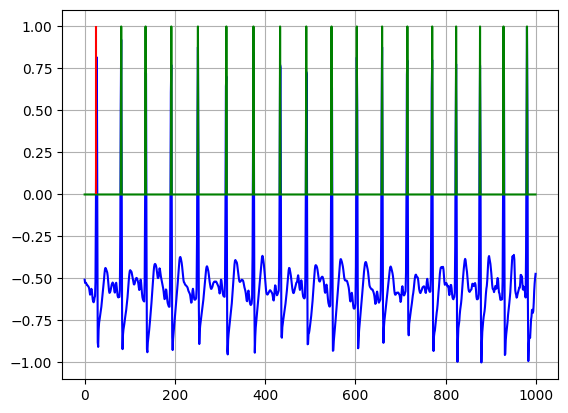

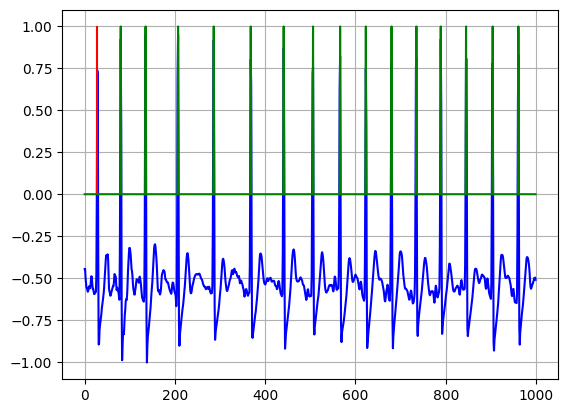

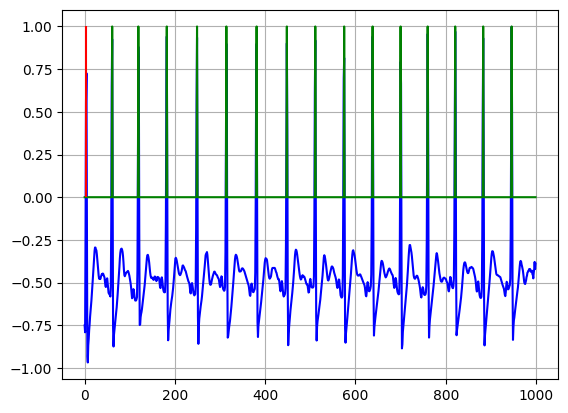

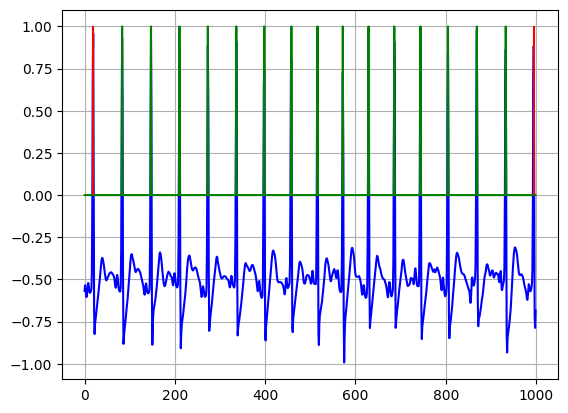

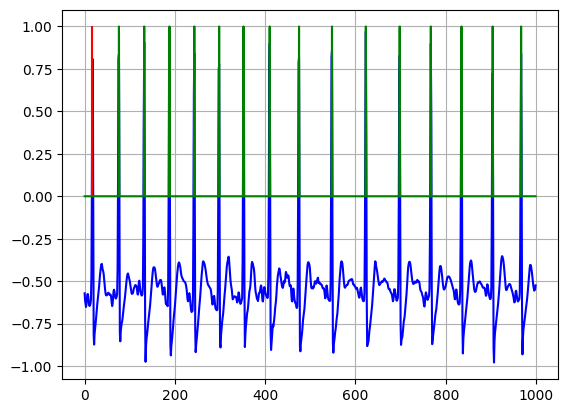

...

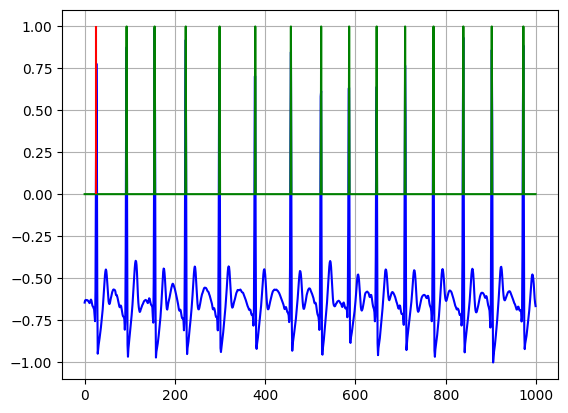

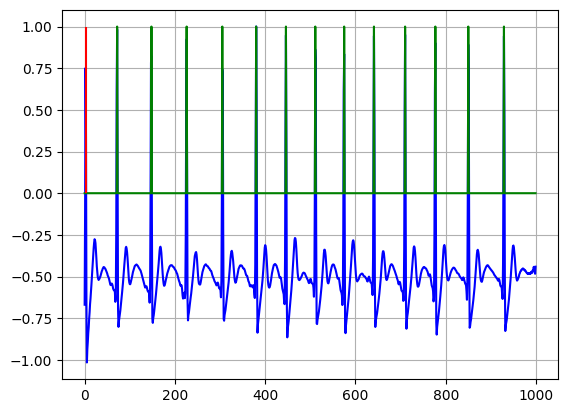

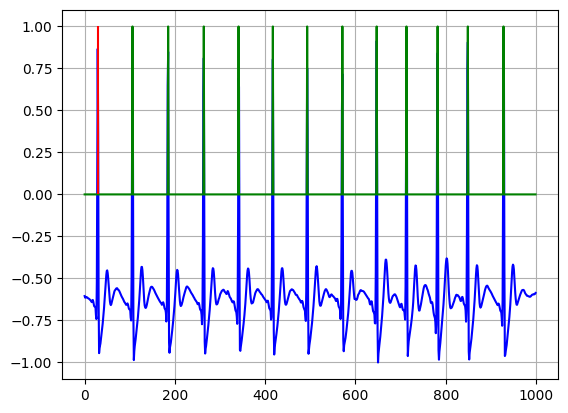

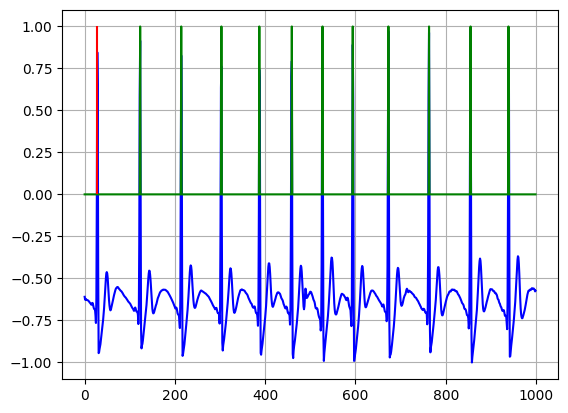

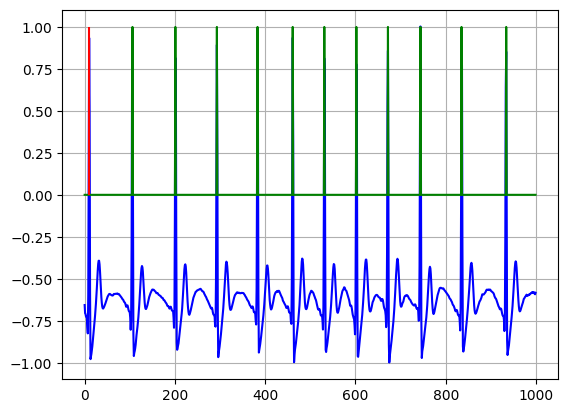

In [41]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# plotting error indices

x_cuda = torch.Tensor(x).to(device)
predictions = lstm(x_cuda)
predictions = torch.nn.Sigmoid()(predictions)
predictions = predictions.cpu().detach().numpy()

for i in range(len(predictions)):
    prediction = predictions[i].flatten()
    prediction = np.where(prediction > 0.5, 1, 0)
    y_flatten = y[i].flatten()

    corrected_predictions = correct_prediction_according_to_aami(y_flatten, prediction)

    error_indices = np.where(corrected_predictions!= y_flatten)[0]
    if len(error_indices) != 0:
        plt.plot(x[i].flatten(), 'b-')
        plt.plot(y_flatten, 'g-')
        for error in error_indices:
            plt.vlines(x=error, ymin=0, ymax=1, color="r")
        plt.grid()
        plt.show()
